This notebook explains the pipeline for long axis

In [1]:
from utils import *

# Download your dicom files and convert to nifti

In [2]:
#convert_zip_to_nifti(patients_csv = "/workspace/Milos/TestNifti/patients.csv",  
#                         data_root = "/workspace/Milos/TestNifti/",
#                         output_dir = "/workspace/Milos/UKBB_nifti",
#                         start=0,
#                         end=10000):

In [3]:
image_path= "demo_image/1/la_4ch.nii.gz"
nim = nib.load(image_path)
image = nim.get_fdata()
seg_image = np.zeros_like(image)
create_video(image,seg_image,cut=0)

/opt/conda/lib/python3.8/site-packages/matplotlib/image.py:446: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/opt/conda/lib/python3.8/site-packages/matplotlib/image.py:480: UserWarning: Warning: converting a masked element to nan.
  vrange = np.array([vmin, vmax], dtype=scaled_dtype)


# Segment Nifti files

specify absolute path of your dir

In [4]:
%cd ukbb_cardiac
!bash -i segment.rc /workspace/Milos/UKB/demo_image
%cd ..

/workspace/Milos/UKB/ukbb_cardiac
Activating environment
# conda environments:
#
                         /opt/conda
base                     /root/miniconda3
echonet                  /root/miniconda3/envs/echonet
ukb_cardiac              /root/miniconda3/envs/ukb_cardiac
ukb_milos                /root/miniconda3/envs/ukb_milos
ukb_seg               *  /root/miniconda3/envs/ukb_seg
                         /workspace/Milos/UKBB-CMR/ukbb_cardiac/env

Instructions for updating:
non-resource variables are not supported in the long term
2021-08-03 09:52:48.821895: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2021-08-03 09:52:48.827770: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 3800010000 Hz
2021-08-03 09:52:48.829525: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x56263ccf4b90 initialized for platform Host (this does not guarantee that XLA wil

In [5]:
%ls

 ExamplePipeline.ipynb      Traits.ipynb          extract.py
 GWAS/                     'UKB project.pdf'      iterate.py
 LA_RV_traits.csv           WallThickness.ipynb   mri.png
 LA_RV_traits_cleaned.csv   __pycache__/          ukb45494.csv
 LA_traits.csv              core.13357            ukbb_cardiac/
 LA_traits_cleaned.csv      data@                 utils.py
 MeanPapillaryMass.csv      demo_image/
 README.md                  environment.yml


In [3]:
image_path= "demo_image/1/la_4ch.nii.gz"
seg_image_path= "demo_image/1/seg4_la_4ch.nii.gz"
nim = nib.load(image_path)
image = nim.get_fdata()
seg_nim = nib.load(seg_image_path)
seg_image = seg_nim.get_fdata()

In [7]:
create_video(image,seg_image,cut=0)

# Extract traits

Here we are going to extract traits and prepare a document for GWAS

## Left Ventricle Shape

In [8]:
orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

In [9]:
orig_image, masked_image,shape_properties = segment_right_ventricle(image_path,seg_image_path)
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

In [4]:
figs,dists = segment_mitral_valve(image_path,seg_image_path)
create_video_mitral_valve(figs,dists)

IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(208, 150)
IMG SHAPE
(20

In [ ]:
#!bash python iterate.py

In [21]:
import pandas as pd
df = pd.read_csv("LA_traits.csv")
df

,id,mitral_valve_distance_mean,mitral_valve_distance_ED,mitral_valve_distance_ES,left_ventricle_height_mean,left_ventricle_height_ED,left_ventricle_height_ES,left_ventricle_width_mean,left_ventricle_width_ED,left_ventricle_width_ES,...,10.512482734487513,48.55213901031024,54.38632351089771,42.94249055843762,26.485260058775435,30.167447539954455,22.11788454456859,-22.93345205467868,-20.295218961784638,-27.10843373493976
0,1000158,14.585599,18.717840,9.878047e+00,37.622694,45.076566,21.425468,17.700609,22.559405,11.342896,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000243,11.705458,15.395778,6.402310e+00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000262,5.760992,10.174257,1.943095e-01,39.574230,45.795016,29.654733,23.620716,28.551404,19.034660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1000369,8.571434,48.478257,8.284961e-02,48.232380,52.346370,44.202334,27.807905,31.621891,23.732224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1000489,10.093875,17.456578,1.291830e+00,46.820928,52.507317,41.227126,24.613501,29.122172,20.096731,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36262,6024290,11.779436,15.569828,8.694877e+00,48.138843,52.766186,40.231015,24.770485,27.659696,20.851153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36263,6024323,3.720606,11.766201,2.213662e-01,32.465728,43.521535,22.021155,18.872417,23.705701,13.816361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36264,6024624,13.014242,17.013090,6.566455e+00,48.994987,54.222933,40.490206,23.729676,27.854550,17.887525,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36265,6024638,5.374556,49.286627,1.854362e-01,37.870789,39.681264,34.952932,25.801510,29.218729,20.851423,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
with open("mitral_distance.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['mitral_valve_distance_mean'][i]}\n")

with open("height.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_height_mean'][i]}\n")

with open("width.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_width_mean'][i]}\n")

with open("angle.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_angle_mean'][i]}\n")

# GWAS

Steps:

Step 1: Download the data (*.bed, *.fam, *.bim)

    *.bed - individual identifiers and genotypes ( ./gfetch 22418 -c5 )

    *.fam info on the individuals ( ./gfetch 22418 -c5 -m)

    *.bim genetics markers (downloaded using wget)

Step 2: Perform Quality check 7 steps
        * Missingness of SNPs and individuals
        * Sex discrepancy
        * Minor allele frequency 
        * Hardy–Weinberg equilibrium 
        * Heterozygosity
        * Relatedness

Step 3: Stratification ( for example if we have two populations let's say Serbia and US and we put it in the same box, we cannot claim correlation between SNIp and a trait because ethnicity might be underlying factor)

Step 4: Perform GWAS and generate plots

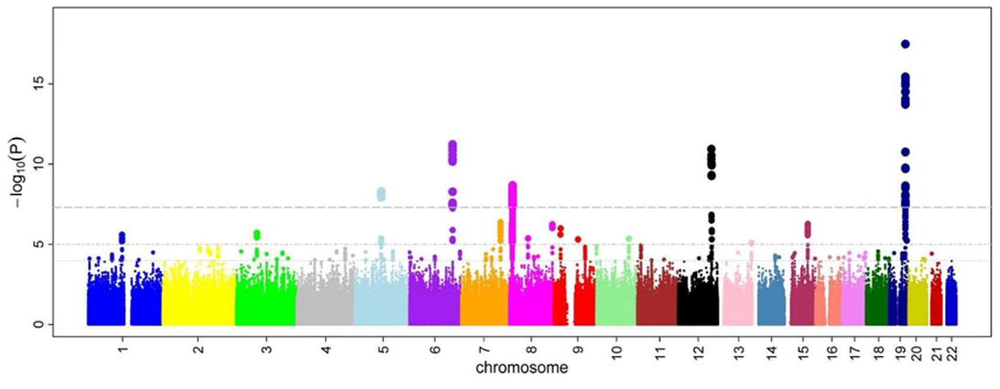

In [17]:
import IPython
url = 'https://upload.wikimedia.org/wikipedia/commons/1/12/Manhattan_Plot.png'
IPython.display.Image(url, width = 1000)

We take the whole area around detected SNP because of the linkage disequilibrium

Traits we have are:
* mitral valve distance
* height ED
* width ED
* height_ED/width_ED
* angle

In [16]:
import pandas as pd
df = pd.read_csv("LA_RV_traits_cleaned.csv")

In [17]:
#with open("mitral_distance_mean.phe",'w') as f:
#    for i in df.index:
#        f.write(f"{df['id'][i]} {df['id'][i]}  {df['mitral_valve_distance_mean'][i]}\n")

In [18]:
with open("RV_height_ED.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['right_ventricle_height_ED'][i]}\n")

In [19]:
with open("RV_width_ED.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['right_ventricle_width_ED'][i]}\n")

In [20]:
with open("RV_angle.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['right_ventricle_angle_mean'][i]}\n")

In [21]:
with open("RV_hw_ratio_ED.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['right_ventricle_height_ED'][i]/df['right_ventricle_width_ED'][i]}\n")